# Imports / API Binance


In [1]:
from binance.client import Client
import matplotlib.pyplot as mpl
import matplotlib.dates as mdates
from datetime import datetime
import time
import numpy as np
import random

In [2]:
with open('API_Key.txt') as api_key:
    binance_key = api_key.read()
with open('Secret_Key.txt') as api_secret:
    binance_secret = api_secret.read()

In [3]:
cliente = Client(binance_key,binance_secret)

In [4]:
btc_price = cliente.get_symbol_ticker(symbol="BTCUSDT")


In [5]:
print(btc_price)

{'symbol': 'BTCUSDT', 'price': '65702.00000000'}


## Datos históricos

In [6]:
klines = cliente.get_historical_klines("BTCUSDT", Client.KLINE_INTERVAL_1HOUR, "1 day ago UTC")

for kline in klines:
    print(kline)

[1728903600000, '64860.18000000', '65188.57000000', '64800.01000000', '64920.06000000', '1604.40044000', 1728907199999, '104244298.44742000', 240849, '877.82931000', '57046693.96878740', '0']
[1728907200000, '64920.05000000', '65000.00000000', '64743.00000000', '64868.05000000', '1400.73972000', 1728910799999, '90903227.05148280', 206547, '619.93507000', '40238286.30215440', '0']
[1728910800000, '64868.06000000', '65292.00000000', '64660.56000000', '65150.01000000', '1898.59510000', 1728914399999, '123347515.76654310', 310900, '994.85075000', '64637890.38480920', '0']
[1728914400000, '65150.01000000', '66299.93000000', '65116.00000000', '65922.00000000', '5246.02328000', 1728917999999, '345345997.84075390', 524637, '3145.30270000', '207022969.73270200', '0']
[1728918000000, '65922.00000000', '66111.16000000', '65800.00000000', '65870.00000000', '2620.60347000', 1728921599999, '172862261.26153310', 280643, '1117.48581000', '73721103.83042860', '0']
[1728921600000, '65870.00000000', '660

In [7]:
klines_hourly = cliente.get_historical_klines("BTCUSDT", Client.KLINE_INTERVAL_1HOUR, "1460 days ago UTC")
klines_daily = cliente.get_historical_klines("BTCUSDT", Client.KLINE_INTERVAL_1DAY, "1460 days ago UTC")
"""
[
  1499040000000,      # Open time (hora de apertura en formato de timestamp Unix)
  "0.01634790",       # Open (precio de apertura)
  "0.80000000",       # High (precio más alto durante el intervalo)
  "0.01575800",       # Low (precio más bajo durante el intervalo)
  "0.01577100",       # Close (precio de cierre)
  "148976.11427815",  # Volume (volumen de la criptomoneda negociado)
  1499644799999,      # Close time (hora de cierre en formato de timestamp Unix)
  "2434.19055334",    # Quote asset volume (volumen en la otra moneda del par, en este caso, USDT)
  308,                # Number of trades (número de transacciones)
  "1756.87402397",    # Taker buy base asset volume (volumen de la criptomoneda comprada por el lado del comprador)
  "28.46694368",      # Taker buy quote asset volume (volumen en la otra moneda comprada por el lado del comprador)
  "17928899.62484339" # Ignore

"""
price_trend_hourly = {}
profit_trend_hourly = {} # Si abrieses un trade nada mas abre y lo cierras nada mas cierra
profit_percentage_hourly = {}
price_trend_daily = {}
profit_trend_daily = {}
profit_percentage_daily = {}

def info_scrap(kline, info):
    open_price = kline[1]
    close_price = kline[4]
    open_time = kline[0]
    close_time = kline[6]
    price_change = float(close_price)-float(open_price) # Cantidad absoluta
    price_change_relative = ((float(close_price)-float(open_price))/float(open_price))*100
    print(f'*\tOpen time {open_time}')
    print(f'*\tClose time {close_time}')
    print(f'*\tOpen price {open_price}')
    print(f'*\tClose price {close_price}')
    print(f'*\tChange of price {price_change}')
    print(f'*\tChange percentage {price_change_relative}')
    if 'hourly' in info:
      price_trend_hourly[open_time] = open_price
      price_trend_hourly[close_time] = close_price
      profit_trend_hourly[close_time] = price_change
      profit_percentage_hourly[close_time] = price_change_relative
    elif 'daily' in info:
      price_trend_daily[open_time] = open_price
      price_trend_daily[close_time] = close_price
      profit_trend_daily[close_time] = price_change
      profit_percentage_daily[close_time] = price_change_relative


for kline in klines_hourly:
    print('*HOURLY*\n'+'*'*45)
    info_scrap(kline, 'hourly')

print('*'*100)

for kline in klines_daily:
    print('*DAILY*\n'+'*'*45)
    info_scrap(kline, 'daily')

*HOURLY*
*********************************************
*	Open time 1602846000000
*	Close time 1602849599999
*	Open price 11305.11000000
*	Close price 11369.34000000
*	Change of price 64.22999999999956
*	Change percentage 0.568150155106846
*HOURLY*
*********************************************
*	Open time 1602849600000
*	Close time 1602853199999
*	Open price 11369.27000000
*	Close price 11368.15000000
*	Change of price -1.1200000000008004
*	Change percentage -0.00985111621063446
*HOURLY*
*********************************************
*	Open time 1602853200000
*	Close time 1602856799999
*	Open price 11368.15000000
*	Close price 11349.81000000
*	Change of price -18.340000000000146
*	Change percentage -0.16132792054995884
*HOURLY*
*********************************************
*	Open time 1602856800000
*	Close time 1602860399999
*	Open price 11349.81000000
*	Close price 11329.12000000
*	Change of price -20.68999999999869
*	Change percentage -0.18229380051294858
*HOURLY*
*********************

# BTC Plots


## Hourly BTC Plot

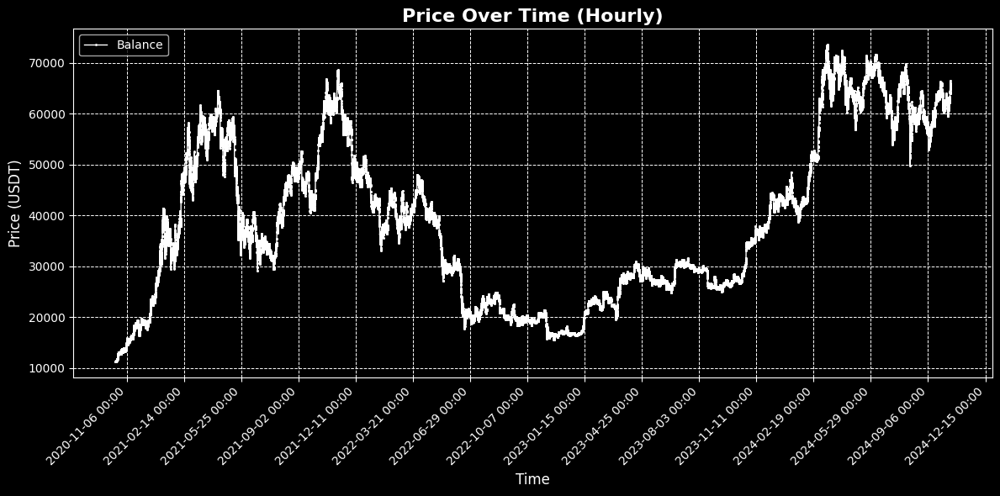

In [33]:
timestamps = []
prices = []

for time_stamp in price_trend_hourly.keys():
    timestamps.append(datetime.utcfromtimestamp(time_stamp / 1000))

for price in price_trend_hourly.values():
    prices.append(float(price))


mpl.style.use('dark_background')

fig, ax = mpl.subplots(figsize=(12, 6))

ax.plot(timestamps, prices, color='white', marker='o', linestyle='-', linewidth=1, markersize=1, label='Balance')

ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d %H:%M'))
ax.xaxis.set_major_locator(mdates.DayLocator(interval=100))

mpl.title('Price Over Time (Hourly)', fontsize=16, fontweight='bold')
mpl.xlabel('Time', fontsize=12)
mpl.ylabel('Price (USDT)', fontsize=12)

mpl.xticks(rotation=45, ha='right')

mpl.legend(loc='upper left')

mpl.grid(True, which='both', linestyle='--', linewidth=0.7)

mpl.tight_layout()

mpl.show()

## Daily BTC Plot

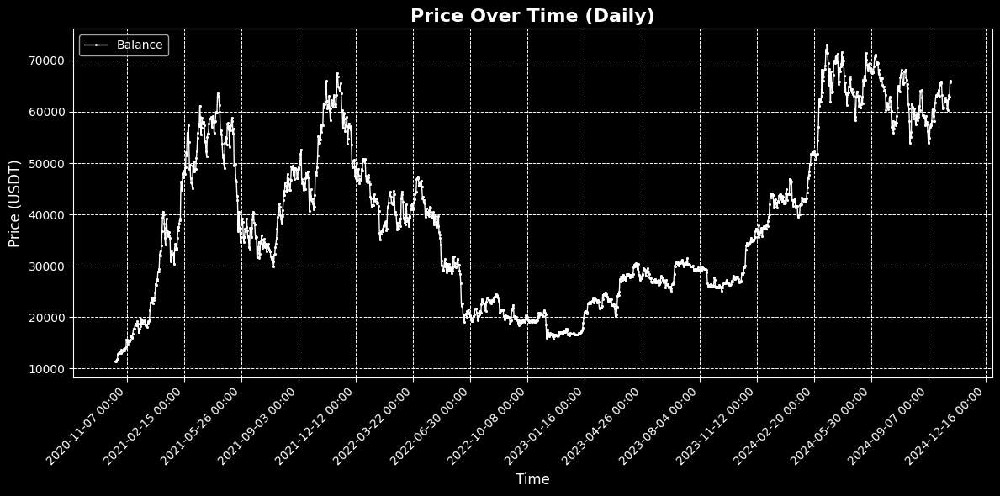

In [34]:
timestamps = []
prices = []

for time_stamp in price_trend_daily.keys():
    timestamps.append(datetime.utcfromtimestamp(time_stamp / 1000))

for price in price_trend_daily.values():
    prices.append(float(price))


mpl.style.use('dark_background')

fig, ax = mpl.subplots(figsize=(12, 6))

ax.plot(timestamps, prices, color='white', marker='o', linestyle='-', linewidth=1, markersize=1, label='Balance')

ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d %H:%M'))
ax.xaxis.set_major_locator(mdates.DayLocator(interval=100))

mpl.title('Price Over Time (Daily)', fontsize=16, fontweight='bold')
mpl.xlabel('Time', fontsize=12)
mpl.ylabel('Price (USDT)', fontsize=12)

mpl.xticks(rotation=45, ha='right')

mpl.legend(loc='upper left')

mpl.grid(True, which='both', linestyle='--', linewidth=0.7)

mpl.tight_layout()

mpl.show()

# Price Variations

## Hourly Variations

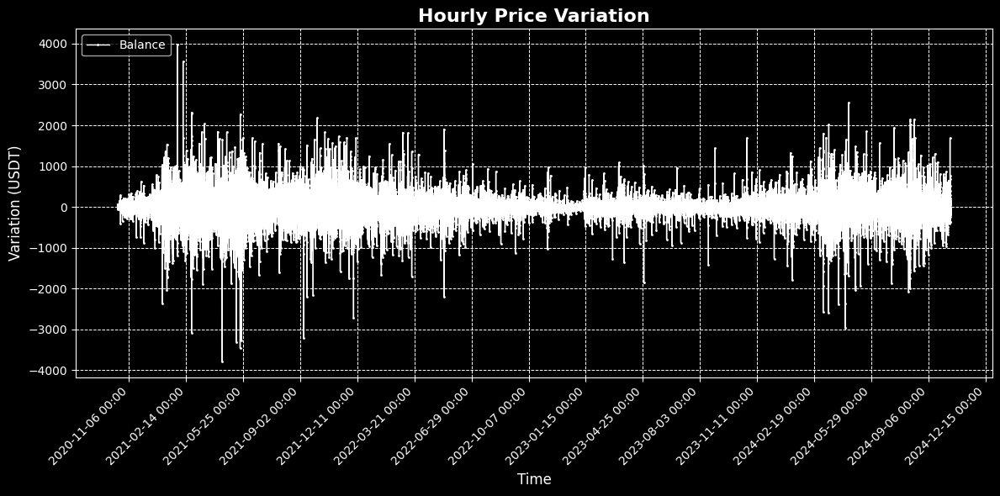

In [35]:
timestamps = []
prices = []

for time_stamp in profit_trend_hourly.keys():
    timestamps.append(datetime.utcfromtimestamp(time_stamp / 1000))

for price in profit_trend_hourly.values():
    prices.append(float(price))

mpl.style.use('dark_background')

fig, ax = mpl.subplots(figsize=(12, 6))

ax.plot(timestamps, prices, color='white', marker='o', linestyle='-', linewidth=1, markersize=1, label='Balance')

ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d %H:%M'))
ax.xaxis.set_major_locator(mdates.DayLocator(interval=100))

mpl.title('Hourly Price Variation', fontsize=16, fontweight='bold')
mpl.xlabel('Time', fontsize=12)
mpl.ylabel('Variation (USDT)', fontsize=12)

mpl.xticks(rotation=45, ha='right')

mpl.legend(loc='upper left')

mpl.grid(True, which='both', linestyle='--', linewidth=0.7)

mpl.tight_layout()

mpl.show()

## Daily Variations

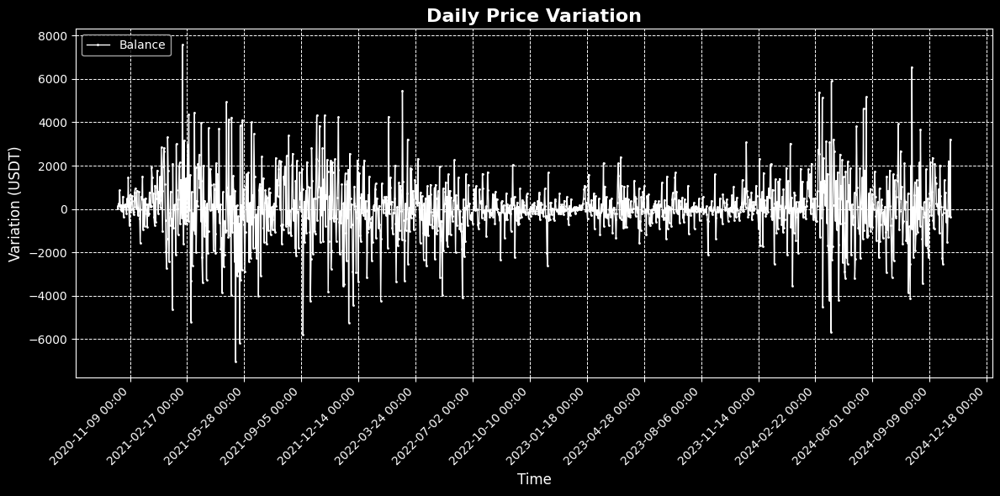

In [36]:
timestamps = []
prices = []

for time_stamp in profit_trend_daily.keys():
    timestamps.append(datetime.utcfromtimestamp(time_stamp / 1000))

for price in profit_trend_daily.values():
    prices.append(float(price))

mpl.style.use('dark_background')

fig, ax = mpl.subplots(figsize=(12, 6))

ax.plot(timestamps, prices, color='white', marker='o', linestyle='-', linewidth=1, markersize=1, label='Balance')

ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d %H:%M'))
ax.xaxis.set_major_locator(mdates.DayLocator(interval=100))

mpl.title('Daily Price Variation', fontsize=16, fontweight='bold')
mpl.xlabel('Time', fontsize=12)
mpl.ylabel('Variation (USDT)', fontsize=12)

mpl.xticks(rotation=45, ha='right')

mpl.legend(loc='upper left')

mpl.grid(True, which='both', linestyle='--', linewidth=0.7)

mpl.tight_layout()

mpl.show()

## Daily Variation (%)

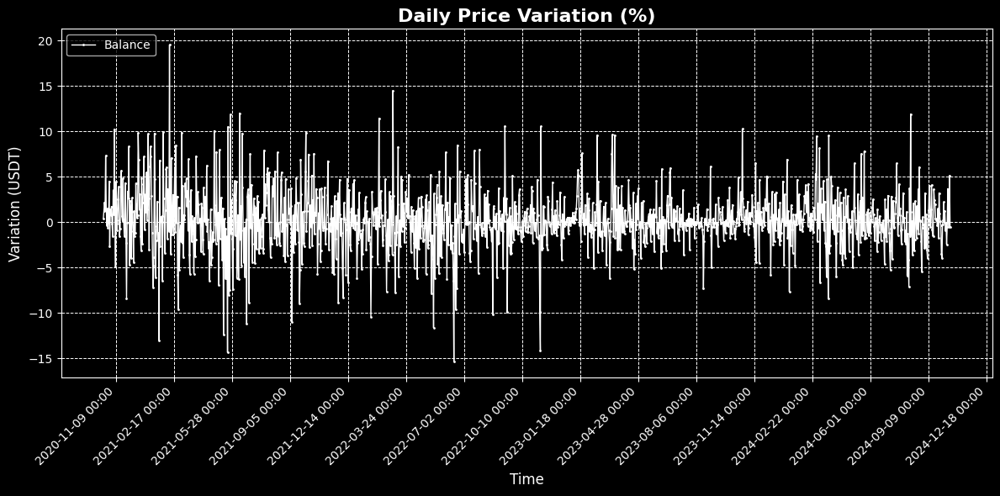

In [37]:
timestamps = []
prices = []

for time_stamp in profit_percentage_daily.keys():
    timestamps.append(datetime.utcfromtimestamp(time_stamp / 1000))

for price in profit_percentage_daily.values():
    prices.append(float(price))

mpl.style.use('dark_background')

fig, ax = mpl.subplots(figsize=(12, 6))

ax.plot(timestamps, prices, color='white', marker='o', linestyle='-', linewidth=1, markersize=1, label='Balance')

ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d %H:%M'))
ax.xaxis.set_major_locator(mdates.DayLocator(interval=100))

mpl.title('Daily Price Variation (%)', fontsize=16, fontweight='bold')
mpl.xlabel('Time', fontsize=12)
mpl.ylabel('Variation (USDT)', fontsize=12)

mpl.xticks(rotation=45, ha='right')

mpl.legend(loc='upper left')

mpl.grid(True, which='both', linestyle='--', linewidth=0.7)

mpl.tight_layout()

mpl.show()

# State Declarations

## Price State Declaration

In [13]:
estados = ['bajada','subida','estable']

In [14]:
def traducción_movimientos(cambios_porcentuales, modo='estados'):
    matriz_cambios = {}
    if modo == 'estados':
        for key,value in cambios_porcentuales.items():
            if value > 0.5:
                matriz_cambios[key] = estados[1]
            elif value < -0.5:
                matriz_cambios[key] = estados[0]
            elif value > -0.5 and value < 0.5:
                matriz_cambios[key] = estados[2]
        return matriz_cambios
    elif modo == 'numeros':
        for key,value in cambios_porcentuales.items():
            if value > 0.5:
                matriz_cambios[key] = 1
            elif value < -0.5:
                matriz_cambios[key] = -1
            elif value > -0.5 and value < 0.5:
                matriz_cambios[key] = 0
        return matriz_cambios
    else:
        return 'Tienes que dar un modo válido'
            

### 
    Condición para subida --> +0.5%
    Condición para bajada --> -0.5%
    Condición para estable --> [ -0.5% , +0.5% ]

###    

## Daily price state

In [15]:
profit_percentage_daily

{1602979199999: 0.36186175043554997,
 1603065599999: 1.2572720286682313,
 1603151999999: 2.158801857579756,
 1603238399999: 1.3490238659707021,
 1603324799999: 7.312846347607045,
 1603411199999: 1.4691626078281825,
 1603497599999: -0.35292285200527135,
 1603583999999: 1.4599483404085416,
 1603670399999: -0.6322582908586406,
 1603756799999: 0.17306694582506574,
 1603843199999: 4.474511862030397,
 1603929599999: -2.7116138267664813,
 1604015999999: 1.4269131037809888,
 1604102399999: 0.7759542617286802,
 1604188799999: 1.7027898024350827,
 1604275199999: -0.2139076209121891,
 1604361599999: -1.541402856812736,
 1604447999999: 3.4975124782005227,
 1604534399999: 0.8591274807412939,
 1604620799999: 10.223479762811255,
 1604707199999: -0.06478503555479957,
 1604793599999: -4.888532875308176,
 1604879999999: 4.432357287948017,
 1604966399999: -0.9479098681107101,
 1605052799999: -0.20354361606977323,
 1605139199999: 2.5300692086988454,
 1605225599999: 3.874013739898309,
 1605311999999: 0.177

In [39]:
# obtenemos los cambios de subida/ bajada a partir de profit_percentage_daily

matriz_cambios_estados = traducción_movimientos(profit_percentage_daily)
matriz_cambios_numeros = traducción_movimientos(profit_percentage_daily, 'numeros')
matriz_cambios_estados

{1602979199999: 'estable',
 1603065599999: 'subida',
 1603151999999: 'subida',
 1603238399999: 'subida',
 1603324799999: 'subida',
 1603411199999: 'subida',
 1603497599999: 'estable',
 1603583999999: 'subida',
 1603670399999: 'bajada',
 1603756799999: 'estable',
 1603843199999: 'subida',
 1603929599999: 'bajada',
 1604015999999: 'subida',
 1604102399999: 'subida',
 1604188799999: 'subida',
 1604275199999: 'estable',
 1604361599999: 'bajada',
 1604447999999: 'subida',
 1604534399999: 'subida',
 1604620799999: 'subida',
 1604707199999: 'estable',
 1604793599999: 'bajada',
 1604879999999: 'subida',
 1604966399999: 'bajada',
 1605052799999: 'estable',
 1605139199999: 'subida',
 1605225599999: 'subida',
 1605311999999: 'estable',
 1605398399999: 'bajada',
 1605484799999: 'bajada',
 1605571199999: 'subida',
 1605657599999: 'subida',
 1605743999999: 'subida',
 1605830399999: 'estable',
 1605916799999: 'subida',
 1606003199999: 'estable',
 1606089599999: 'bajada',
 1606175999999: 'estable',
 1

# Markov Transition Matrix

## Algorithm for probability obtention

In [17]:
matriz_transicion = np.zeros((3,3))
(matriz_transicion)

array([[0., 0., 0.],
       [0., 0., 0.],
       [0., 0., 0.]])

In [18]:
fechas_ordenadas = sorted(matriz_cambios_estados.keys())

for i in range(len(fechas_ordenadas)-1):
    fecha_actual = fechas_ordenadas[i]
    fecha_mañana = fechas_ordenadas[i+1]

    estado_actual = matriz_cambios_estados[fecha_actual]
    estado_mañana = matriz_cambios_estados[fecha_mañana]

    estado1 = estados.index(estado_actual)
    estado2 = estados.index(estado_mañana)

    matriz_transicion[estado1,estado2] += 1 

matriz_transicion_normalizada = matriz_transicion / matriz_transicion.sum(axis=1, keepdims=True)

## Probability Obtention for the data

In [49]:
print('La matriz de transición resulta en la siguiente:\n', matriz_transicion_normalizada)

# 0 = bajada
# 1 = subida
# 2 = estable

lista = [[0,0,0],[0,0,0],[0,0,0]]

"""

Recordemos que estados = ['bajada','subida','estable']


"""
print('\n','*'*50,'\nY los estados, indices de la matriz, se traducen a los siguientes:\n','*'*50)
for i in range(len(estados)):
    for j in range(len(estados)):
        lista[i][j] = f'{estados[i]} --> {estados[j]}'

for fila in lista:
    print(fila)

La matriz de transición resulta en la siguiente:
 [[0.37567084 0.45796064 0.16636852]
 [0.42444822 0.3820034  0.19354839]
 [0.32154341 0.34726688 0.33118971]]

 ************************************************** 
Y los estados, indices de la matriz, se traducen a los siguientes:
 **************************************************
['bajada --> bajada', 'bajada --> subida', 'bajada --> estable']
['subida --> bajada', 'subida --> subida', 'subida --> estable']
['estable --> bajada', 'estable --> subida', 'estable --> estable']


In [20]:
dicc_probabilidades = {}

for i in range(len(lista)):
    for j in range(len(lista[i])):
        dicc_probabilidades[lista[i][j]] = matriz_transicion_normalizada[i][j]

dicc_probabilidades

{'bajada --> bajada': 0.3756708407871199,
 'bajada --> subida': 0.45796064400715564,
 'bajada --> estable': 0.16636851520572452,
 'subida --> bajada': 0.4244482173174873,
 'subida --> subida': 0.38200339558573854,
 'subida --> estable': 0.1935483870967742,
 'estable --> bajada': 0.3215434083601286,
 'estable --> subida': 0.34726688102893893,
 'estable --> estable': 0.3311897106109325}

## Prediction Model

In [21]:
def predecir_estado(estado_actual, matriz_transicion_normalizada = matriz_transicion_normalizada):

    indice_estado_actual = estados.index(estado_actual)

    estado_predecido = random.choices(estados, matriz_transicion_normalizada[indice_estado_actual])[0]

    return estado_actual, estado_predecido

In [22]:
dicc_prueba_subida = {}
dicc_prueba_bajada = {}
dicc_prueba_estable = {}

for i in range(10):
    actual1, predecido1 = predecir_estado('subida')
    actual2, predecido2 = predecir_estado('bajada')
    actual3, predecido3 = predecir_estado('estable')

    if predecido1 not in dicc_prueba_subida:
        dicc_prueba_subida[predecido1] = 0
    else:
        dicc_prueba_subida[predecido1] += 1

    if predecido2 not in dicc_prueba_bajada:
        dicc_prueba_bajada[predecido2] = 0
    else:
        dicc_prueba_bajada[predecido2] += 1

    if predecido3 not in dicc_prueba_estable:
        dicc_prueba_estable[predecido3] = 0
    else:
        dicc_prueba_estable[predecido3] += 1

### Comprobamos las predicciones, y vemos que según la tabla de transición tiene mucho sentido

In [23]:
print(f'Prueba en estado estable: {dicc_prueba_estable}')
print(f'Prueba en estado subida: {dicc_prueba_subida}')
print(f'Prueba en estado bajada: {dicc_prueba_bajada}')

Prueba en estado estable: {'bajada': 4, 'estable': 2, 'subida': 1}
Prueba en estado subida: {'bajada': 3, 'subida': 3, 'estable': 1}
Prueba en estado bajada: {'bajada': 5, 'subida': 3}


# Backtesting

## Backtesting with a Daily TF

In [65]:
capital_inicial = 1000
capital = capital_inicial
acciones = 0
estado_ahora = 'subida'
operaciones_totales = 0
operaciones_venta= 0
seguimiento_capital_diario = {}



for fecha in price_trend_daily.keys():
    estado_ahora, estado_futuro = predecir_estado(estado_ahora, matriz_transicion_normalizada)

    precio_hoy = price_trend_daily[fecha]

    if estado_futuro == 'subida' and capital > 0:
        acciones = capital / float(precio_hoy)
        capital = 0
        print(f'+ Comprar en {fecha}: {acciones} acciones a {precio_hoy} USD')
        operaciones_totales += 1

    elif estado_futuro == 'bajada' and acciones > 0:
        capital = acciones * float(precio_hoy)
        print(f"- Vender en {fecha}: capital total ahora es {capital} USD")
        acciones = 0
        operaciones_totales += 1
        operaciones_venta += 1
        seguimiento_capital_diario[operaciones_venta] = capital

    else:
        print(f'· Holdear en {fecha} con {capital} capital y {acciones} acciones.')

if acciones > 0:
    capital += acciones * float(price_trend_daily[fecha])

ganancia = capital - capital_inicial
print('*'* 100)
print(f'Capital final: {capital} USD, Ganancia/Pérdida: {ganancia} USD')
print(f'Acciones finales: {acciones}')
print(f'Operaciones totales: {operaciones_totales}')

+ Comprar en 1602892800000: 0.08834515391492716 acciones a 11319.24000000 USD
· Holdear en 1602979199999 con 0 capital y 0.08834515391492716 acciones.
- Vender en 1602979200000: capital total ahora es 1003.628335471286 USD
· Holdear en 1603065599999 con 1003.628335471286 capital y 0 acciones.
· Holdear en 1603065600000 con 1003.628335471286 capital y 0 acciones.
+ Comprar en 1603151999999: 0.08540449283972866 acciones a 11751.47000000 USD
· Holdear en 1603152000000 con 0 capital y 0.08540449283972866 acciones.
· Holdear en 1603238399999 con 0 capital y 0.08540449283972866 acciones.
· Holdear en 1603238400000 con 0 capital y 0.08540449283972866 acciones.
· Holdear en 1603324799999 con 0 capital y 0.08540449283972866 acciones.
· Holdear en 1603324800000 con 0 capital y 0.08540449283972866 acciones.
- Vender en 1603411199999: capital total ahora es 1107.569873481878 USD
· Holdear en 1603411200000 con 1107.569873481878 capital y 0 acciones.
+ Comprar en 1603497599999: 0.0857048575517952 ac

## Backtesting con TF Horario

In [67]:
capital_inicial = 1000
capital = capital_inicial
acciones = 0
estado_ahora = 'subida'
operaciones_totales = 0
operaciones_venta= 0
seguimiento_capital_horario = {}

for fecha in price_trend_hourly.keys():
    estado_ahora, estado_futuro = predecir_estado(estado_ahora, matriz_transicion_normalizada)

    precio_hoy = price_trend_hourly[fecha]

    if estado_futuro == 'subida' and capital > 0:
        acciones = capital / float(precio_hoy)
        capital = 0
        print(f'+ Comprar en {fecha}: {acciones} acciones a {precio_hoy} USD')
        operaciones_totales += 1

    elif estado_futuro == 'bajada' and acciones > 0:
        capital = acciones * float(precio_hoy)
        print(f"- Vender en {fecha}: capital total ahora es {capital} USD")
        acciones = 0
        operaciones_totales += 1
        operaciones_venta += 1
        seguimiento_capital_horario[operaciones_venta] = capital
    else:
        print(f'· Holdear en {fecha} con {capital} capital y {acciones} acciones.')

if acciones > 0:
    capital += acciones * float(price_trend_hourly[fecha])

ganancia = capital - capital_inicial
print('*'* 100)
print(f'Capital final: {capital} USD, Ganancia/Pérdida: {ganancia} USD')
print(f'Acciones finales: {acciones}')
print(f'Operaciones totales: {operaciones_totales}')

· Holdear en 1602846000000 con 1000 capital y 0 acciones.
+ Comprar en 1602849599999: 0.08795585319816278 acciones a 11369.34000000 USD
· Holdear en 1602849600000 con 0 capital y 0.08795585319816278 acciones.
- Vender en 1602853199999: capital total ahora es 999.8953325346941 USD
· Holdear en 1602853200000 con 999.8953325346941 capital y 0 acciones.
· Holdear en 1602856799999 con 999.8953325346941 capital y 0 acciones.
· Holdear en 1602856800000 con 999.8953325346941 capital y 0 acciones.
· Holdear en 1602860399999 con 999.8953325346941 capital y 0 acciones.
· Holdear en 1602860400000 con 999.8953325346941 capital y 0 acciones.
+ Comprar en 1602863999999: 0.08824274701374649 acciones a 11331.19000000 USD
- Vender en 1602864000000: capital total ahora es 999.8953325346941 USD
· Holdear en 1602867599999 con 999.8953325346941 capital y 0 acciones.
· Holdear en 1602867600000 con 999.8953325346941 capital y 0 acciones.
+ Comprar en 1602871199999: 0.08821316406407895 acciones a 11334.9900000

In [68]:
seguimiento_capital_horario

{1: 999.8953325346941,
 2: 999.8953325346941,
 3: 1002.3908829460671,
 4: 1002.4015201706742,
 5: 1004.2161583452767,
 6: 1002.2138155637444,
 7: 1005.3538320646663,
 8: 1005.5177274578521,
 9: 1005.1677886453743,
 10: 1007.0278944722181,
 11: 1008.2377894133947,
 12: 1007.6346191187919,
 13: 1008.82939467572,
 14: 1010.589284783505,
 15: 1010.1368437982561,
 16: 1011.6239761023448,
 17: 1009.6177107995953,
 18: 1011.3809839504264,
 19: 1011.3809839504264,
 20: 1011.3809839504265,
 21: 1012.3669912080425,
 22: 1012.0908392203376,
 23: 1014.7470295740319,
 24: 1012.5572859329495,
 25: 1012.5564002296352,
 26: 1012.5564002296353,
 27: 1012.5564002296353,
 28: 1012.5564002296353,
 29: 1012.6058727773146,
 30: 1009.1814458441611,
 31: 1009.899391115068,
 32: 1010.9789550113705,
 33: 1010.9789550113705,
 34: 1024.8051396067428,
 35: 1013.4992808716577,
 36: 1013.801083566229,
 37: 1013.801083566229,
 38: 1009.1044350150001,
 39: 1017.2863628664733,
 40: 1021.7037580057766,
 41: 1020.5326472

## Graphing the profit evolution

### Hourly

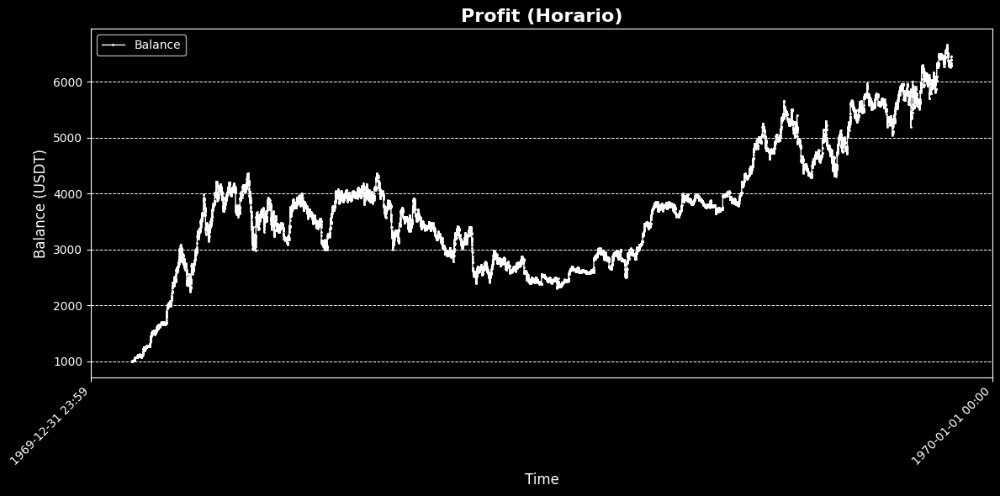

In [69]:
timestamps = []
account = []

for time_stamp in seguimiento_capital_horario.keys():
    timestamps.append(datetime.utcfromtimestamp(time_stamp / 1000))
for transacction in seguimiento_capital_horario.values():
    account.append(float(transacction))

mpl.style.use('dark_background')

fig, ax = mpl.subplots(figsize=(12, 6))


ax.plot(timestamps, account, color='white', marker='o', linestyle='-', linewidth=1, markersize=1, label='Balance')

ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d %H:%M'))
ax.xaxis.set_major_locator(mdates.HourLocator(interval=100))

mpl.title('Profit (Horario)', fontsize=16, fontweight='bold')
mpl.xlabel('Time', fontsize=12)
mpl.ylabel('Balance (USDT)', fontsize=12)

mpl.xticks(rotation=45, ha='right')

mpl.legend(loc='upper left')

mpl.grid(True, which='both', linestyle='--', linewidth=0.7)

mpl.tight_layout()

mpl.show()

### Daily

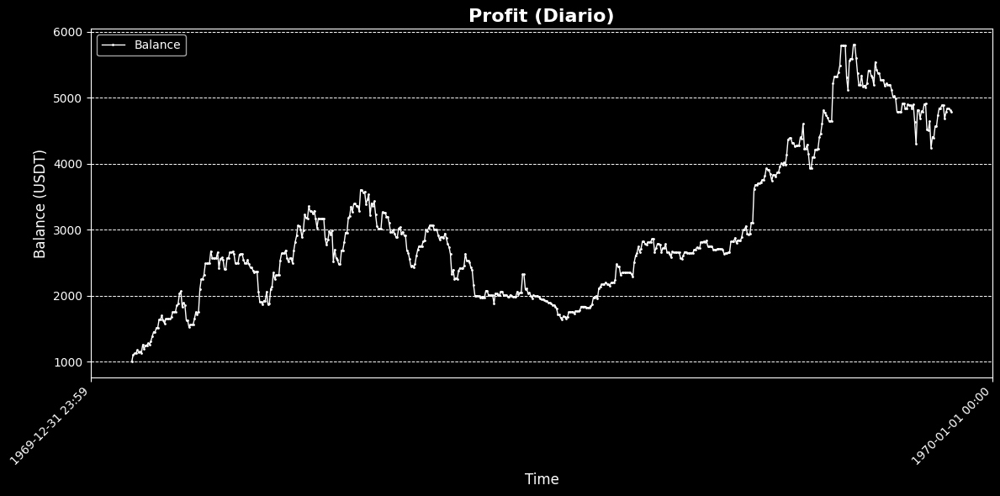

In [70]:
timestamps = []
account = []

for time_stamp in seguimiento_capital_diario.keys():
    timestamps.append(datetime.utcfromtimestamp(time_stamp / 1000))

for transacction in seguimiento_capital_diario.values():
    account.append(float(transacction))

mpl.style.use('dark_background')

fig, ax = mpl.subplots(figsize=(12, 6))


ax.plot(timestamps, account, color='white', marker='o', linestyle='-', linewidth=1, markersize=1, label='Balance')

ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d %H:%M'))
ax.xaxis.set_major_locator(mdates.HourLocator(interval=100))

mpl.title('Profit (Diario)', fontsize=16, fontweight='bold')
mpl.xlabel('Time', fontsize=12)
mpl.ylabel('Balance (USDT)', fontsize=12)

mpl.xticks(rotation=45, ha='right')

mpl.legend(loc='upper left')

mpl.grid(True, which='both', linestyle='--', linewidth=0.7)

mpl.tight_layout()

mpl.show()